In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import xarray as xr
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
plt.style.use("plot_style.mplstyle")

In [2]:
interleaver_2_stages = xr.open_dataset('interleaver_2_stage_dataset.nc')
interleaver_2_stages

<xarray.Dataset>
Dimensions:              (wavelength: 4000, idd_rand: 500, idd_fom: 8,
                          channel_offset: 8, fom_params: 7, wg_params: 6,
                          route_wg: 6, dc_params: 3, dc_sigma: 3, sim_mode: 1,
                          dc_variability_mode: 1)
Coordinates:
  * wavelength           (wavelength) float64 1.295e-06 1.295e-06 ... 1.325e-06
  * idd_rand             (idd_rand) int32 0 1 2 3 4 5 ... 495 496 497 498 499
  * idd_fom              (idd_fom) object 'ch1' 'ch2' 'ch3' ... 'ch7' 'ch8'
  * channel_offset       (channel_offset) float64 0.0 1e+10 ... 6e+10 7e+10
  * fom_params           (fom_params) object '1dB_bandwidth' ... 'ripple_dc_i...
  * wg_params            (wg_params) object 'wg_width' 'wg_height' ... 'ng'
  * route_wg             (route_wg) float64 0.8 1.4 2.0 3.0 4.0 5.0
  * dc_params            (dc_params) object 'dc1' 'dc2' 'dc3'
  * dc_sigma             (dc_sigma) float64 0.02 0.05 0.1
  * sim_mode             (sim_mode) object 'montecarlo'
  * dc_variability_mode  (dc_variability_mode) object 'common'
Data variables:
    wg                   (sim_mode, wg_params, idd_rand) float64 ...
    dc                   (sim_mode, dc_sigma, dc_params, idd_rand) float64 ...
    bar_port_amp         (sim_mode, dc_variability_mode, dc_sigma, idd_rand, route_wg, wavelength) float64 ...
    cross_port_amp       (sim_mode, dc_variability_mode, dc_sigma, idd_rand, route_wg, wavelength) float64 ...
    bar_port_fom         (sim_mode, dc_variability_mode, dc_sigma, idd_rand, route_wg, fom_params, idd_fom) float64 ...
    cross_port_fom       (sim_mode, dc_variability_mode, dc_sigma, idd_rand, route_wg, fom_params, idd_fom) float64 ...
Attributes:
    description:  Interleaver 2 stage data

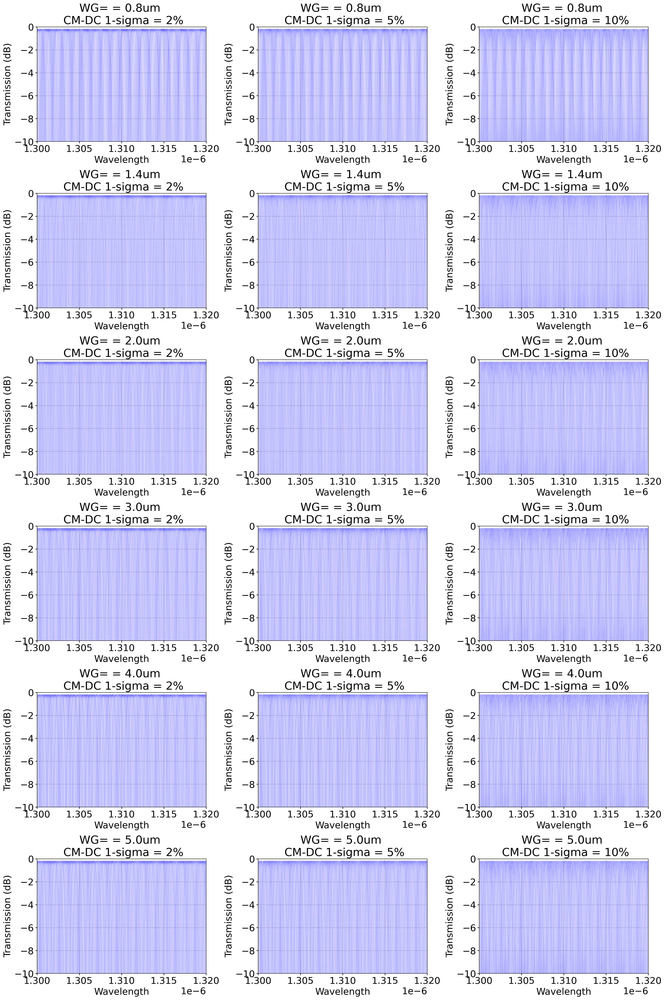

In [3]:
plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
for idd_width, width in enumerate(interleaver_2_stages.route_wg):
  bar_port_amp = interleaver_2_stages['bar_port_amp'].sel(route_wg = width)
  for idd_dc_sigma, dc_sigma in enumerate(bar_port_amp.dc_sigma):
      plotter = bar_port_amp.sel(dc_sigma=dc_sigma)
      plt.subplot(len(interleaver_2_stages.route_wg), len(bar_port_amp.dc_sigma), idd_width*len(bar_port_amp.dc_sigma) + idd_dc_sigma+1)
      for idd_rand in plotter.idd_rand:
          plt.plot(plotter.wavelength.values.flatten(), 10*np.log10(plotter.sel(idd_rand=idd_rand).values.flatten()), color = "blue", alpha = 0.002)
      plt.xlabel("Wavelength")
      plt.ylabel("Transmission (dB)")
      plt.xlim([1.3e-6, 1.32e-6])
      plt.xticks(np.arange(1.3e-6, 1.325e-6, 0.005e-6))
      plt.ylim([-10, 0])
      plt.title(f"WG= = {width:0.1f}um \n " + 
                f"CM-DC 1-sigma = {dc_sigma.values*100:0.0f}%")
plt.tight_layout()

In [4]:
def fom_params(bar_port_fom, fom_param, title):
  fig = plt.figure(figsize=(20, 5))
  for idd_dc_sigma, dc_sigma in enumerate(bar_port_amp.dc_sigma):
    plotter = bar_port_fom.sel(dc_sigma=dc_sigma)
    plt.subplot(1, len(bar_port_fom.dc_sigma), idd_dc_sigma+1)
    if fom_param == "1dB_bandwidth_GHz":
      for idd_ch, ch in enumerate(plotter['idd_fom']):
        plt.hist(plotter.sel(idd_fom=ch, fom_params="1dB_bandwidth").values.flatten()/1e9, density=True, bins=20, alpha=0.5,edgecolor='black', label=f"{ch.values}")
      plt.xlim([100, 200])
      plt.legend()
    elif fom_param == "channel_center_frequency_GHz":
      for idd_ch, ch in enumerate(plotter['idd_fom']):
        plt.hist(plotter.sel(idd_fom=ch, fom_params="channel_center_frequency").values.flatten()/1e9-3e8/1.31e-6/1e9, density=True, bins=20, alpha=0.5,edgecolor='black', label=f"{ch.values}")
      plt.legend()
    elif fom_param == "fsr_roll_off_GHz":
      plt.hist((plotter.sel(idd_fom=plotter['idd_fom'].values[0], fom_params='channel_center_frequency').values.flatten()/1e9-plotter.sel(idd_fom=plotter['idd_fom'].values[-1], fom_params='channel_center_frequency').values.flatten()/1e9)/7, density=True, bins=100, alpha=0.5,edgecolor='black')
      plt.xlim([380, 420])
    elif fom_param == "fsr_roll_off_norm_GHz":
      plt.hist(np.abs((plotter.sel(idd_fom=plotter['idd_fom'].values[0], fom_params='channel_center_frequency').values.flatten()/1e9-plotter.sel(idd_fom=plotter['idd_fom'].values[-1], fom_params='channel_center_frequency').values.flatten()/1e9)/7-400), histtype = "step", density=True, cumulative=True, bins=1000, alpha=0.5,edgecolor='black')
      plt.xlim([0,10])
      plt.yticks(np.arange(0,1.1,0.1))
    elif fom_param == "min_dc_il_bandwidth_GHz":
      for idd_ch, ch in enumerate(plotter['idd_fom']):
        plt.hist(plotter.sel(idd_fom=ch, fom_params='min_dc_il_bandwidth').values.flatten()/1e9, density=True, bins=50, alpha=0.5,edgecolor='black', label=f"{ch.values}")
      plt.legend()    
    elif fom_param == "min_dc_il_dB":  
      for idd_ch, ch in enumerate(plotter['idd_fom']):
          plt.hist(plotter.sel(idd_fom=ch, fom_params='min_dc_il_dB').values.flatten(), density=True, bins=100, alpha=0.5,edgecolor='black', label=f"{ch.values}")
      plt.legend()
    elif fom_param == "ave_dc_il_dB":
      for idd_ch, ch in enumerate(plotter['idd_fom']):
          plt.hist(plotter.sel(idd_fom=ch, fom_params='ave_dc_il_dB').values.flatten(), density=True, bins=100, alpha=0.5,edgecolor='black', label=f"{ch.values}")
      plt.legend()
    elif fom_param == "ripple_dc_il_dB":
      for idd_ch, ch in enumerate(plotter['idd_fom']):
          plt.hist(plotter.sel(idd_fom=ch, fom_params='ripple_dc_il_dB').values.flatten(), density=True, bins=100, alpha=0.5,edgecolor='black', label=f"{ch.values}")
      plt.legend()
    elif fom_param == "rf_il_dB":
      for idd_ch, ch in enumerate(plotter['idd_fom']):
          plt.hist(plotter.sel(idd_fom=ch, fom_params='rf_il_dB').values.flatten(), density=True, bins=20, alpha=0.5,edgecolor='black', label=f"RF offset ={idd_ch*10:0.0f} GHz") 
      plt.legend()
      # plt.xlim([-1,-0.3])
    plt.xlabel(fom_param)
    plt.ylabel("Density")
    plt.title(title + f"{dc_sigma.values*100:0.0f}%")
  plt.tight_layout()

  return fig


<Figure size 4000x6000 with 0 Axes>

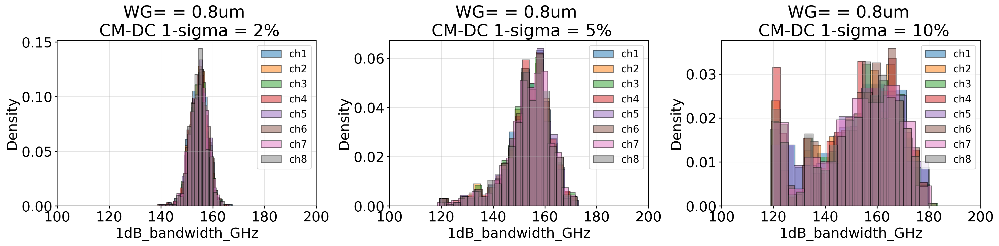

In [5]:
plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
width = interleaver_2_stages.route_wg[0]
bar_port_fom = interleaver_2_stages['bar_port_fom'].sel(route_wg = width)
fig = fom_params(bar_port_fom, '1dB_bandwidth_GHz', f"WG= = {width:0.1f}um \n " + f"CM-DC 1-sigma = ")

<Figure size 4000x6000 with 0 Axes>

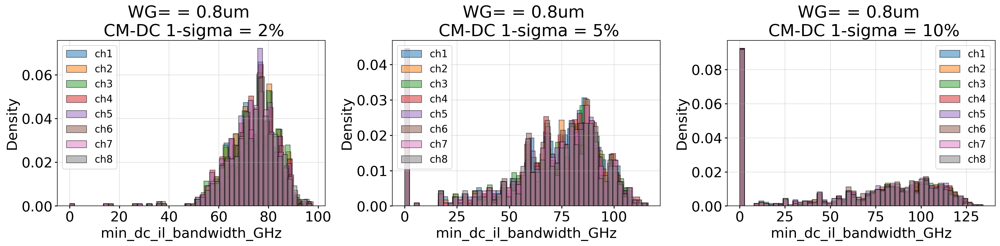

In [6]:
plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
width = interleaver_2_stages.route_wg[0]
bar_port_fom = interleaver_2_stages['bar_port_fom'].sel(route_wg = width)
fig = fom_params(bar_port_fom, 'min_dc_il_bandwidth_GHz', f"WG= = {width:0.1f}um \n " + f"CM-DC 1-sigma = ")

<Figure size 4000x6000 with 0 Axes>

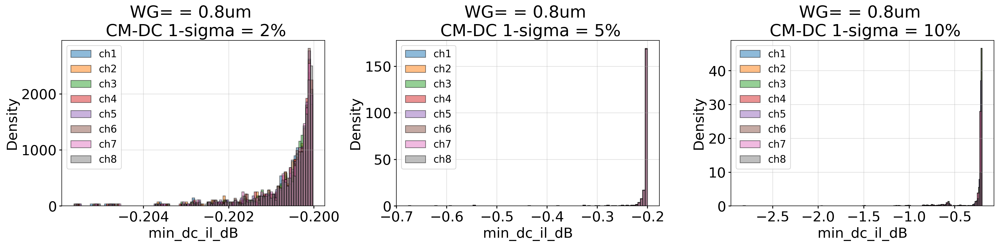

In [7]:
plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
width = interleaver_2_stages.route_wg[0]
bar_port_fom = interleaver_2_stages['bar_port_fom'].sel(route_wg = width)
fig = fom_params(bar_port_fom, 'min_dc_il_dB', f"WG= = {width:0.1f}um \n " + f"CM-DC 1-sigma = ")

<Figure size 4000x6000 with 0 Axes>

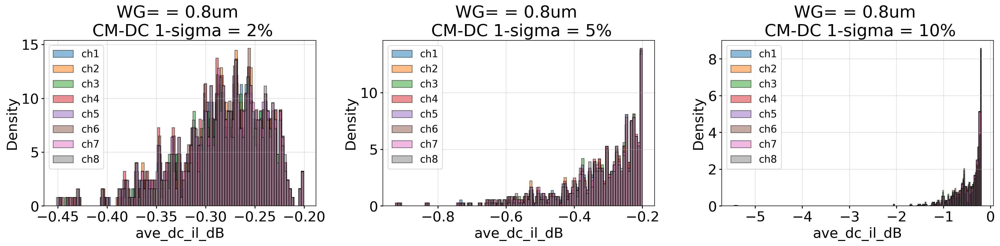

In [8]:
plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
width = interleaver_2_stages.route_wg[0]
bar_port_fom = interleaver_2_stages['bar_port_fom'].sel(route_wg = width)
fig = fom_params(bar_port_fom, 'ave_dc_il_dB', f"WG= = {width:0.1f}um \n " + f"CM-DC 1-sigma = ")

<Figure size 4000x6000 with 0 Axes>

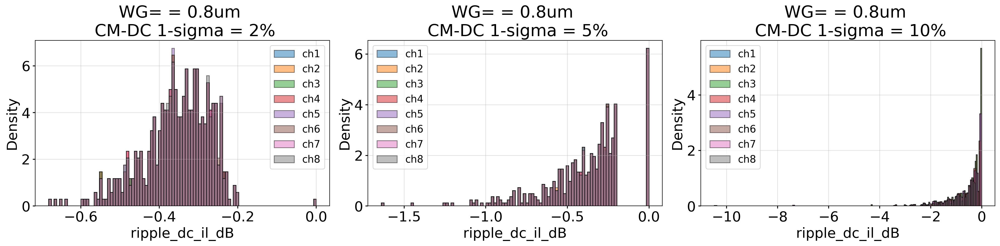

In [9]:
plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
width = interleaver_2_stages.route_wg[0]
bar_port_fom = interleaver_2_stages['bar_port_fom'].sel(route_wg = width)
fig = fom_params(bar_port_fom, 'ripple_dc_il_dB', f"WG= = {width:0.1f}um \n " + f"CM-DC 1-sigma = ")

<Figure size 4000x6000 with 0 Axes>

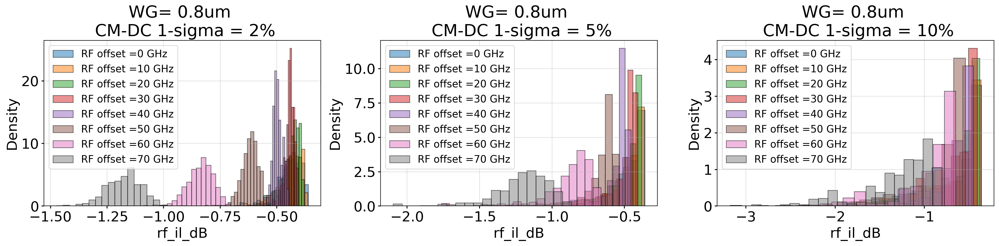

In [10]:
plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
width = interleaver_2_stages.route_wg[0]
fig = fom_params(bar_port_fom, 'rf_il_dB', f"WG= {width:0.1f}um \n " + f"CM-DC 1-sigma = ")

<Figure size 4000x6000 with 0 Axes>

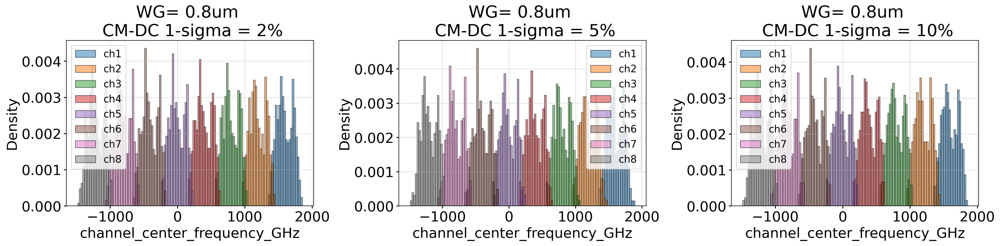

<Figure size 4000x6000 with 0 Axes>

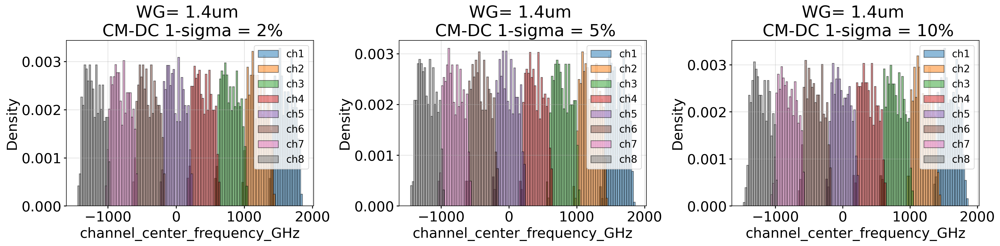

<Figure size 4000x6000 with 0 Axes>

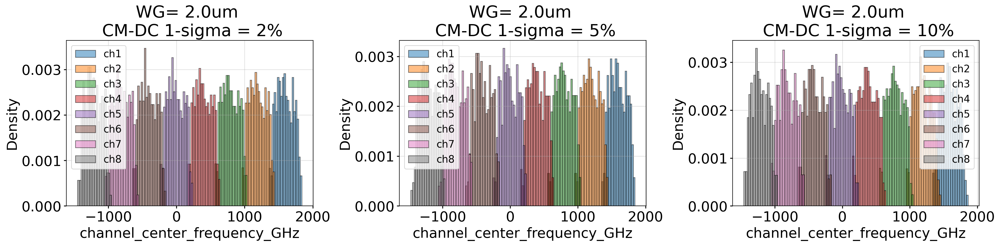

<Figure size 4000x6000 with 0 Axes>

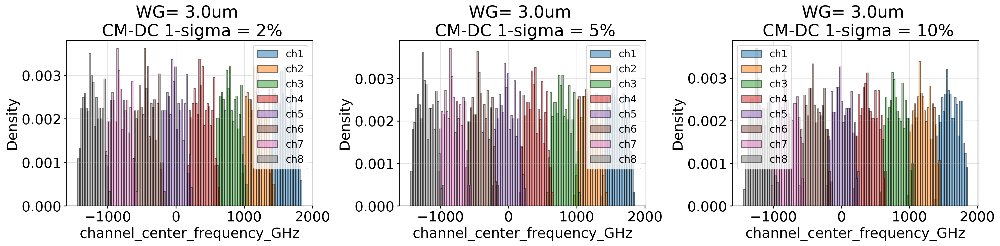

<Figure size 4000x6000 with 0 Axes>

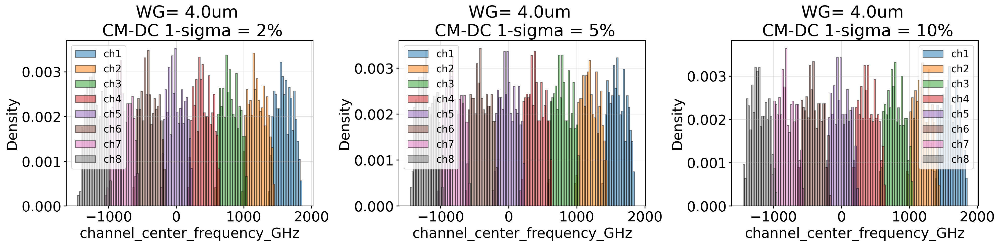

<Figure size 4000x6000 with 0 Axes>

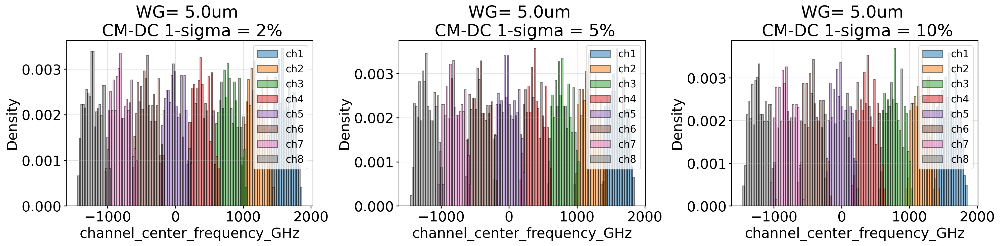

In [11]:
for idd_width, width in enumerate(interleaver_2_stages.route_wg):
  plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
  bar_port_fom = interleaver_2_stages['bar_port_fom'].sel(route_wg = width)  
  fig = fom_params(bar_port_fom, 'channel_center_frequency_GHz', f"WG= {width:0.1f}um \n " + f"CM-DC 1-sigma = ")

<Figure size 4000x6000 with 0 Axes>

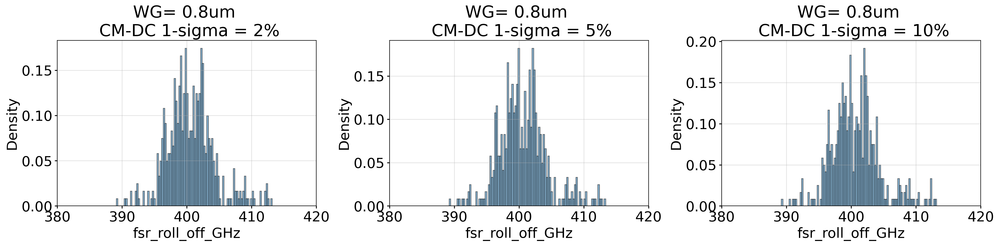

<Figure size 4000x6000 with 0 Axes>

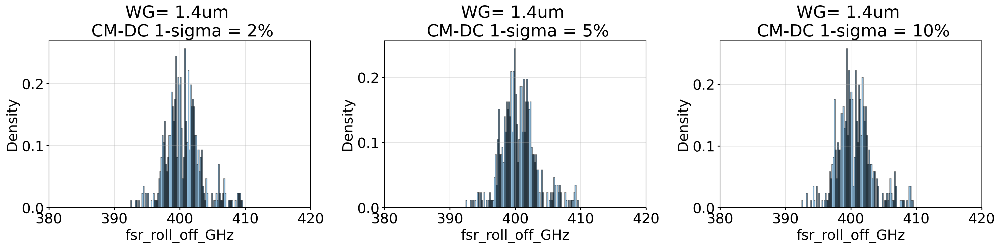

<Figure size 4000x6000 with 0 Axes>

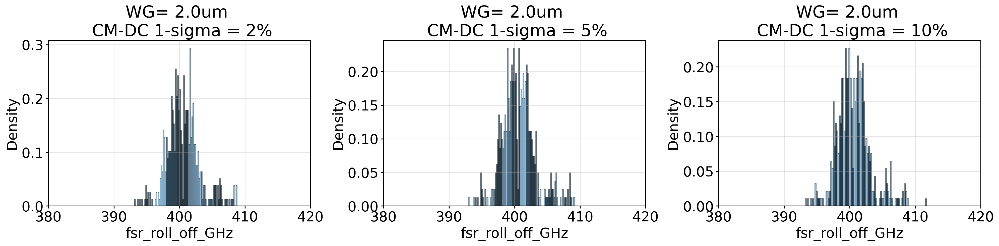

<Figure size 4000x6000 with 0 Axes>

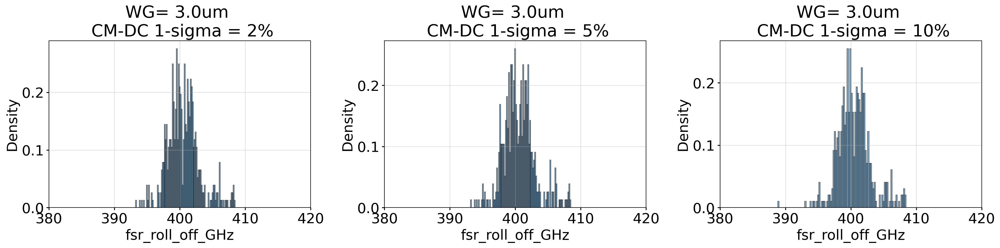

<Figure size 4000x6000 with 0 Axes>

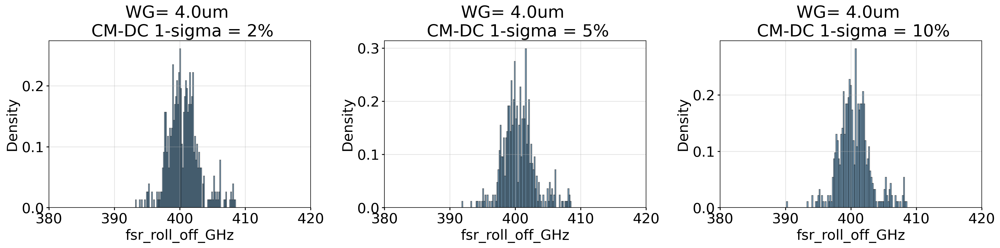

<Figure size 4000x6000 with 0 Axes>

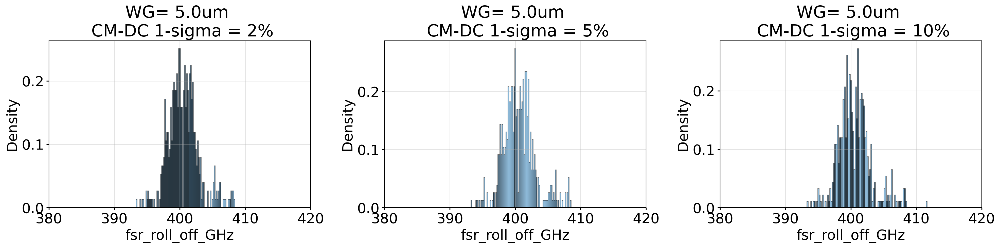

In [12]:
for idd_width, width in enumerate(interleaver_2_stages.route_wg):
  plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
  bar_port_fom = interleaver_2_stages['bar_port_fom'].sel(route_wg = width)  
  fig = fom_params(bar_port_fom, 'fsr_roll_off_GHz', f"WG= {width:0.1f}um \n " + f"CM-DC 1-sigma = ")

<Figure size 4000x6000 with 0 Axes>

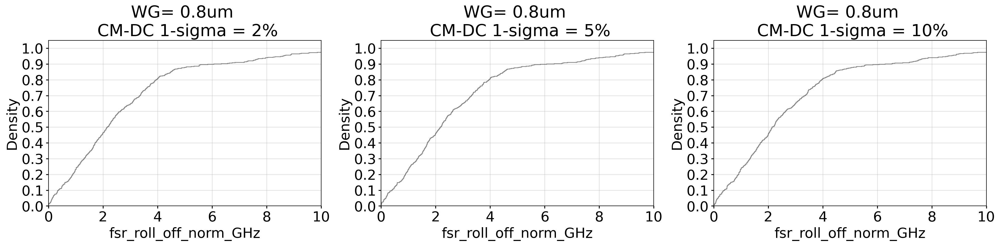

<Figure size 4000x6000 with 0 Axes>

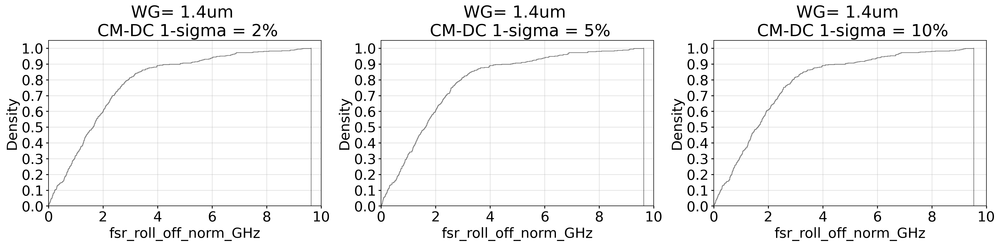

<Figure size 4000x6000 with 0 Axes>

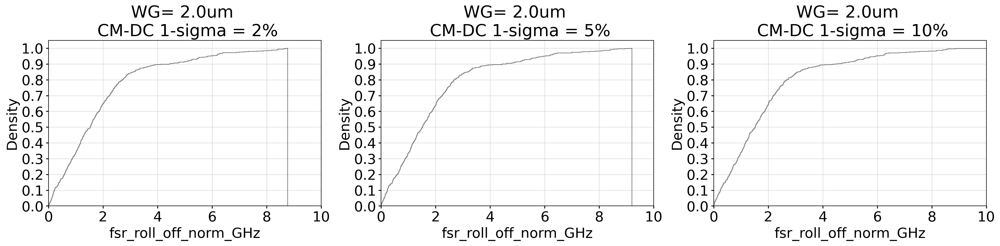

<Figure size 4000x6000 with 0 Axes>

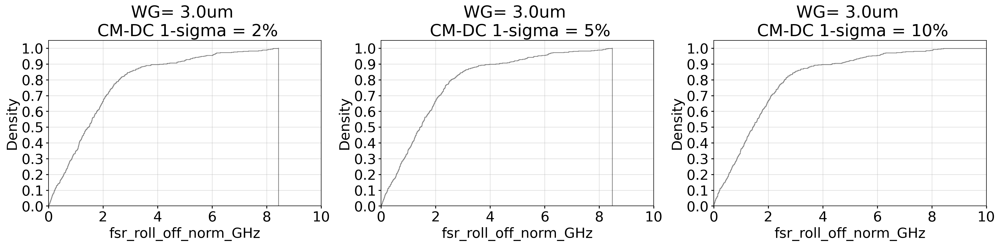

<Figure size 4000x6000 with 0 Axes>

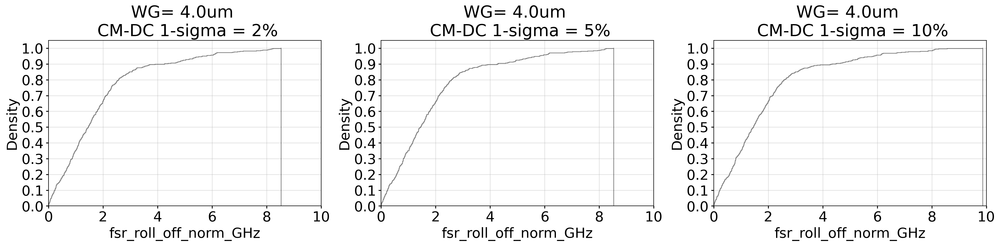

<Figure size 4000x6000 with 0 Axes>

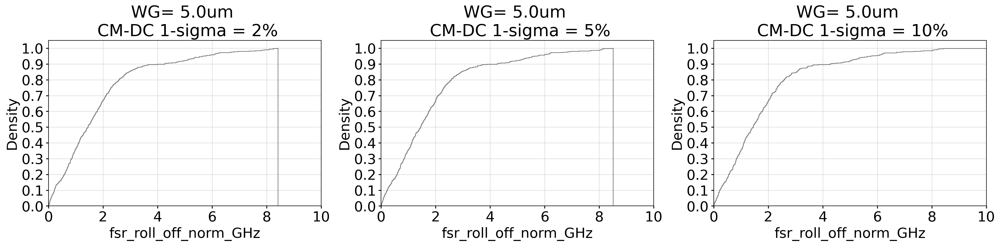

In [13]:
for idd_width, width in enumerate(interleaver_2_stages.route_wg):
  plt.figure(figsize=(20, 5*len(interleaver_2_stages.route_wg)))
  bar_port_fom = interleaver_2_stages['bar_port_fom'].sel(route_wg = width)  
  fig = fom_params(bar_port_fom, 'fsr_roll_off_norm_GHz', f"WG= {width:0.1f}um \n " + f"CM-DC 1-sigma = ")